# Proyek Klasifikasi Gambar: [Food-11]
- **Nama:** [Hardatama Rakha Ugraha]
- **Email:** [hardatama27@gmail.com]
- **ID Dicoding:** [hardatama_rakha]

## Import Semua Packages/Library yang Digunakan

In [1]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import pathlib
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import confusion_matrix
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

## Data Preparation

### Data Loading

In [2]:
!gdown 116_-B-L-0ezltrDVz_4_ZDCfd6DmgQ0F

Downloading...
From (original): https://drive.google.com/uc?id=116_-B-L-0ezltrDVz_4_ZDCfd6DmgQ0F
From (redirected): https://drive.google.com/uc?id=116_-B-L-0ezltrDVz_4_ZDCfd6DmgQ0F&confirm=t&uuid=4d92cf04-e245-4b7e-b7ee-c2290a239695
To: /content/Food-11.zip
100% 1.16G/1.16G [00:20<00:00, 56.3MB/s]


In [3]:
!rm -rf /content/Food-11
!unzip -q Food-11.zip -d /content/

In [4]:
# melihat jumlah citra dan ukuran resolusi

from PIL import Image
import os

def print_images_resolution(directory):
    unique_sizes = set()
    total_images = 0

    for subdir in os.listdir(directory):
        subdir_path = os.path.join(directory, subdir)
        image_files = os.listdir(subdir_path)
        num_images = len(image_files)
        print(f"{subdir}: {num_images}")
        total_images += num_images

        for img_file in image_files:
            img_path = os.path.join(subdir_path, img_file)
            with Image.open(img_path) as img:
                unique_sizes.add(img.size)

        for size in unique_sizes:
            print(f"- {size}")
        print("---------------")

    print(f"\nTotal: {total_images}")

print_images_resolution('/content/Food-11')

Streaming output truncated to the last 5000 lines.
- (500, 374)
- (493, 335)
- (640, 515)
- (682, 1024)
- (382, 512)
- (2274, 870)
- (492, 500)
- (2000, 1570)
- (500, 333)
- (1600, 1200)
- (512, 307)
- (1280, 853)
- (700, 525)
- (350, 263)
- (512, 334)
- (1024, 765)
- (640, 492)
- (512, 343)
- (1701, 1129)
- (1300, 785)
- (1024, 1268)
- (2000, 1035)
- (512, 464)
- (500, 737)
- (1200, 801)
- (500, 328)
- (3191, 2123)
- (800, 440)
- (448, 299)
- (500, 337)
- (512, 320)
- (2560, 1600)
- (1280, 960)
- (384, 512)
- (512, 441)
- (289, 512)
- (500, 323)
- (512, 288)
- (1300, 901)
- (427, 500)
- (500, 332)
- (512, 306)
- (1024, 737)
- (1024, 746)
- (351, 227)
- (350, 500)
- (2272, 1704)
---------------
Soup: 2500
- (308, 512)
- (512, 418)
- (512, 427)
- (376, 512)
- (510, 512)
- (336, 448)
- (1200, 800)
- (531, 800)
- (750, 600)
- (1110, 754)
- (512, 292)
- (500, 336)
- (5488, 3584)
- (1024, 970)
- (464, 261)
- (1024, 741)
- (390, 275)
- (550, 413)
- (3221, 2638)
- (3230, 2705)
- (5184, 3456)


In [5]:
image_size = 128
batch_size = 64
channels = 3
epochs = 100
learning_rate = 0.001

In [6]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    '/content/Food-11',
    shuffle=True,
    image_size=(image_size, image_size),
    batch_size=batch_size
)
class_names = dataset.class_names
print(class_names)

Found 16643 files belonging to 11 classes.
['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']


In [7]:
total_samples = 0
class_counts = {}

for images, labels in dataset:
  total_samples += images.shape[0]
  for label in labels.numpy():
    class_name = class_names[label]
    class_counts[class_name] = class_counts.get(class_name, 0) + 1

print("Total data:", total_samples)
print("\nData per class:")
for class_name, count in class_counts.items():
  print(f"Total citra kelas {class_name}: {count}")

Total data: 16643

Data per class:
Total citra kelas Vegetable-Fruit: 1172
Total citra kelas Dessert: 2500
Total citra kelas Rice: 472
Total citra kelas Bread: 1724
Total citra kelas Noodles-Pasta: 734
Total citra kelas Soup: 2500
Total citra kelas Seafood: 1505
Total citra kelas Egg: 1648
Total citra kelas Meat: 2206
Total citra kelas Fried food: 1461
Total citra kelas Dairy product: 721


Visualisasi Citra: Bread


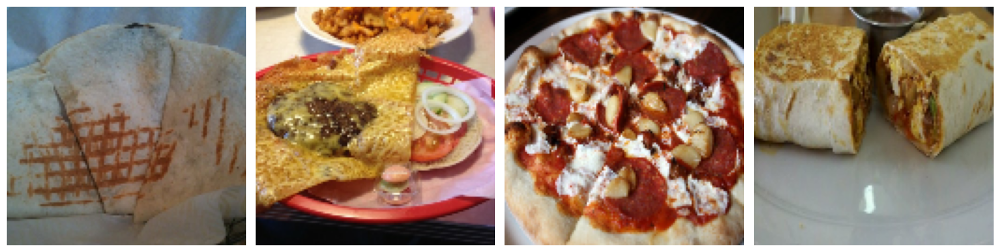

Visualisasi Citra: Dairy product


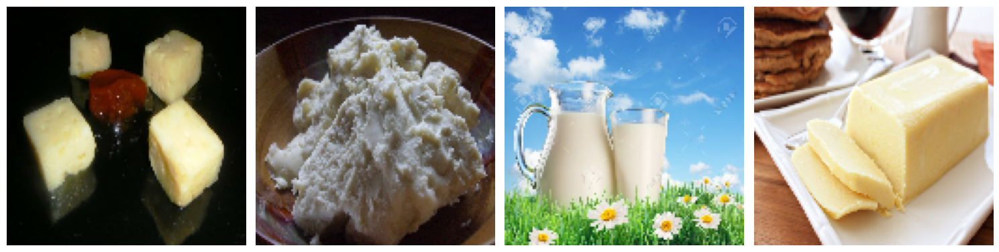

Visualisasi Citra: Dessert


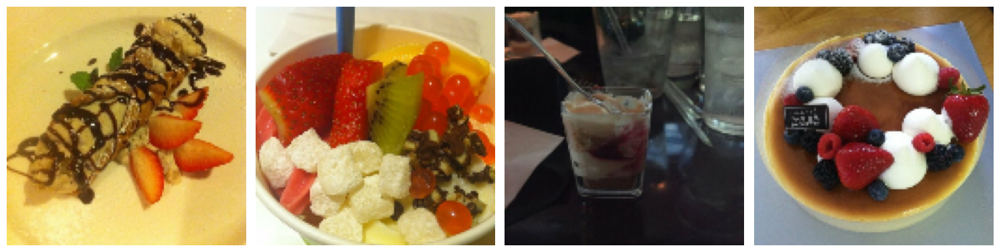

Visualisasi Citra: Egg


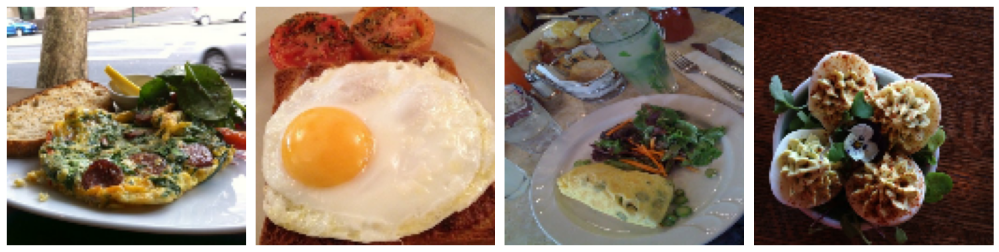

Visualisasi Citra: Fried food


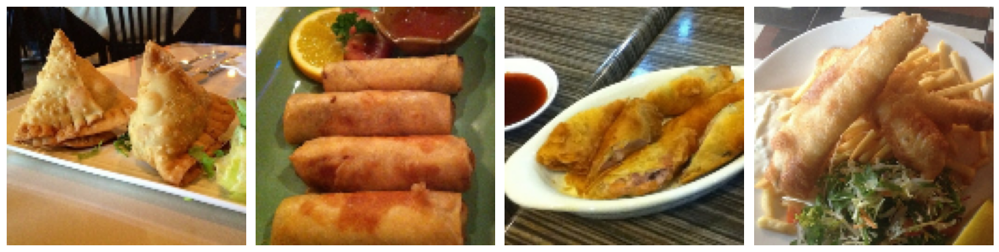

Visualisasi Citra: Meat


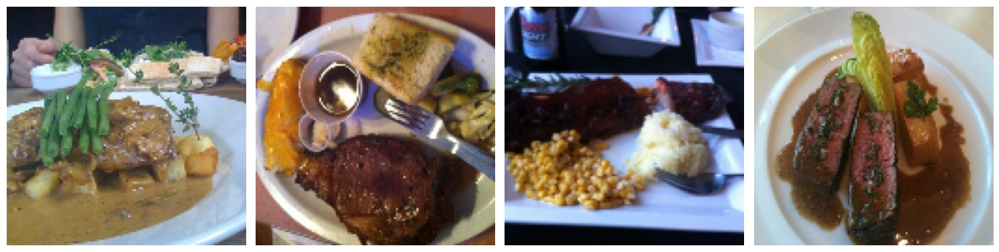

Visualisasi Citra: Noodles-Pasta


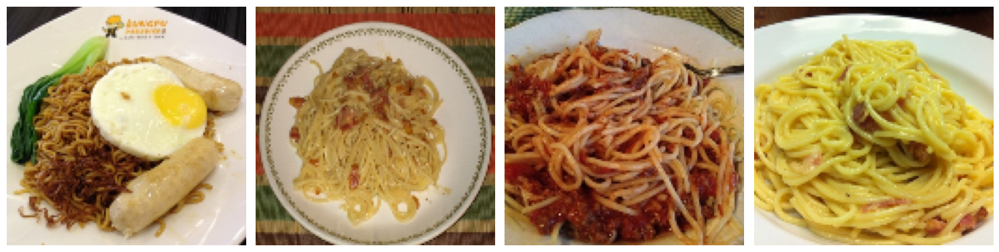

Visualisasi Citra: Rice


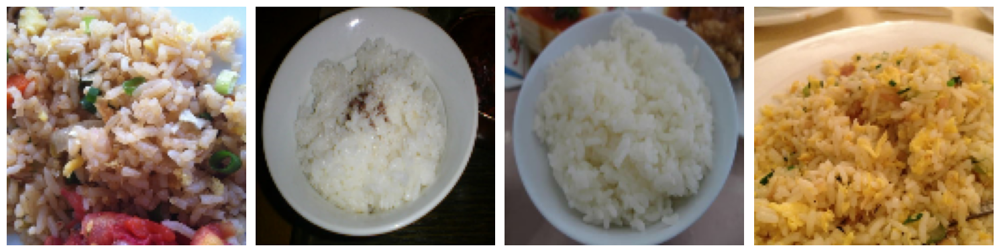

Visualisasi Citra: Seafood


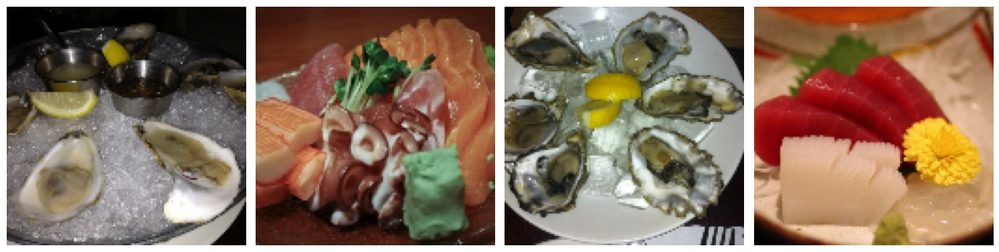

Visualisasi Citra: Soup


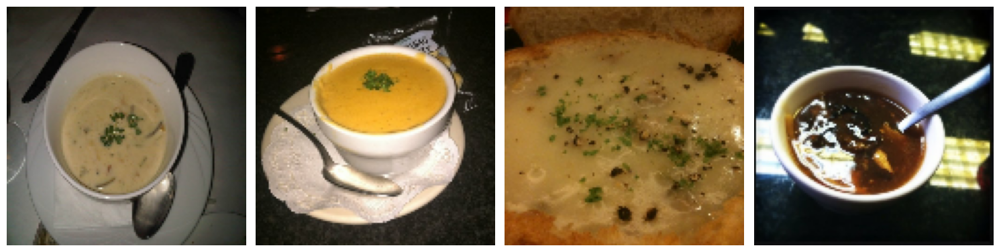

Visualisasi Citra: Vegetable-Fruit


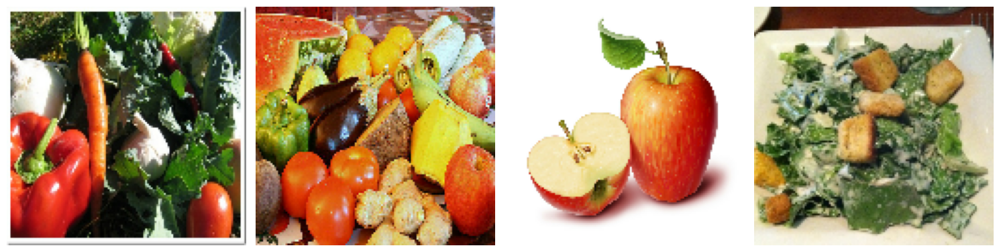

In [8]:
def visualize_images(dataset, class_names):
  for class_name in class_names:
    print(f"Visualisasi Citra: {class_name}")
    count = 0
    fig, axes = plt.subplots(1, 4, figsize=(15, 8))
    for images, labels in dataset:
      for i in range(images.shape[0]):
          if class_names[labels[i]] == class_name and count < 4:
              axes.ravel()[count].imshow(images[i].numpy().astype("uint8"))
              axes.ravel()[count].axis("off")
              count += 1
          if count == 4:
              break
      if count == 4:
          break
    plt.tight_layout()
    plt.show()

visualize_images(dataset, class_names)

### Data Preprocessing

#### Split Dataset

In [9]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
  ds_size = len(ds)

  if shuffle:
    ds = ds.shuffle(shuffle_size, seed=12)

  train_size = int(train_split * ds_size)

  train_dataset = ds.take(train_size)
  test_dataset = ds.skip(train_size)

  val_size = int(val_split * ds_size)

  val_dataset = test_dataset.take(val_size)
  test_dataset = test_dataset.skip(val_size)

  return train_dataset, val_dataset, test_dataset

train_dataset, val_dataset, test_dataset = get_dataset_partitions_tf(dataset)

In [10]:
print("Jumlah Batch: ", len(dataset))
print("Jumlah Batch untuk Train: ", len(train_dataset))
print("Jumlah Batch untuk Validation: ", len(val_dataset))
print("Jumlah Batch untuk Test: ", len(test_dataset))

Jumlah Batch:  261
Jumlah Batch untuk Train:  208
Jumlah Batch untuk Validation:  26
Jumlah Batch untuk Test:  27


#### Normalisasi & Data Augmentation

In [11]:
train_dataset = train_dataset.shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)
test_dataset = test_dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

In [12]:
resize_and_rescale = tf.keras.Sequential([
    layers.Resizing(image_size, image_size),
    layers.Rescaling(1./255)
])

In [13]:
data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal")
])

In [14]:
train_dataset = train_dataset.map(
    lambda x, y: (resize_and_rescale(x), y),
    num_parallel_calls=tf.data.AUTOTUNE
).map(
    lambda x, y: (data_augmentation(x, training=True), y),
    num_parallel_calls=tf.data.AUTOTUNE
)
val_dataset = val_dataset.map(lambda x, y: (resize_and_rescale(x), y))
test_dataset = test_dataset.map(lambda x, y: (resize_and_rescale(x), y))

## Modelling

In [15]:
model = models.Sequential([
    layers.Input(shape=(image_size, image_size, channels)),
    layers.Conv2D(32, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.Conv2D(64, (3,3), activation='relu'),
    layers.MaxPooling2D((2,2)),
    layers.MaxPooling2D((2,2)),
    layers.Flatten(),
    layers.Dropout(0.25),
    layers.Dense(64, activation='relu'),
    layers.Dense(11, activation='softmax', dtype='float32')
])

model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 28, 28, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 3136)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │       200,768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 11)             │           715 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 257,803 (1007.04 KB)

 Trainable params: 257,803 (1007.04 KB)

 Non-trainable params: 0 (0.00 B)

In [16]:
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

In [17]:
model.compile(
    optimizer=Adam(learning_rate=learning_rate),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [18]:
history = model.fit(
    train_dataset,
    batch_size=batch_size,
    validation_data=val_dataset,
    verbose=1,
    epochs=epochs,
    callbacks= early_stopping
)

Epoch 1/100
208/208 ━━━━━━━━━━━━━━━━━━━━ 79s 200ms/step - accuracy: 0.2084 - loss: 2.2212 - val_accuracy: 0.3606 - val_loss: 1.8125
Epoch 2/100
208/208 ━━━━━━━━━━━━━━━━━━━━ 78s 252ms/step - accuracy: 0.3780 - loss: 1.7769 - val_accuracy: 0.4561 - val_loss: 1.5885
Epoch 3/100
208/208 ━━━━━━━━━━━━━━━━━━━━ 86s 252ms/step - accuracy: 0.4451 - loss: 1.6052 - val_accuracy: 0.5066 - val_loss: 1.4109
Epoch 4/100
208/208 ━━━━━━━━━━━━━━━━━━━━ 78s 247ms/step - accuracy: 0.4964 - loss: 1.4492 - val_accuracy: 0.5186 - val_loss: 1.3502
Epoch 5/100
208/208 ━━━━━━━━━━━━━━━━━━━━ 66s 178ms/step - accuracy: 0.5213 - loss: 1.3771 - val_accuracy: 0.5583 - val_loss: 1.2672
Epoch 6/100
208/208 ━━━━━━━━━━━━━━━━━━━━ 77s 251ms/step - accuracy: 0.5405 - loss: 1.3179 - val_accuracy: 0.5733 - val_loss: 1.2340
Epoch 7/100
208/208 ━━━━━━━━━━━━━━━━━━━━ 77s 249ms/step - accuracy: 0.5730 - loss: 1.2444 - val_accuracy: 0.6076 - val_loss: 1.1114
Epoch 8/100
208/208 ━━━━━━━━━━━━━━━━━━━━ 77s 251ms/step - accuracy: 0.5932 -

## Evaluasi dan Visualisasi

In [24]:
# Akurasi dan loss akhir pada Training set
evaluation = model.evaluate(train_dataset)
print("Accuracy:", evaluation[1])
print("Loss:", evaluation[0])

208/208 ━━━━━━━━━━━━━━━━━━━━ 36s 51ms/step - accuracy: 0.9802 - loss: 0.0745
Accuracy: 0.9796241521835327
Loss: 0.07367657870054245


In [25]:
# Akurasi dan loss akhir pada Test set
evaluation = model.evaluate(test_dataset)
print("Accuracy:", evaluation[1])
print("Loss:", evaluation[0])

27/27 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.9755 - loss: 0.0738
Accuracy: 0.9785879850387573
Loss: 0.06690749526023865


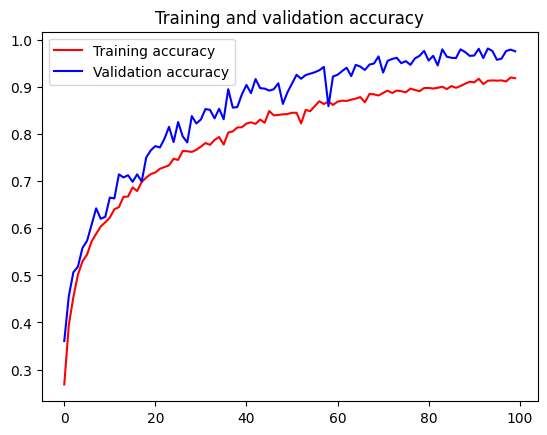

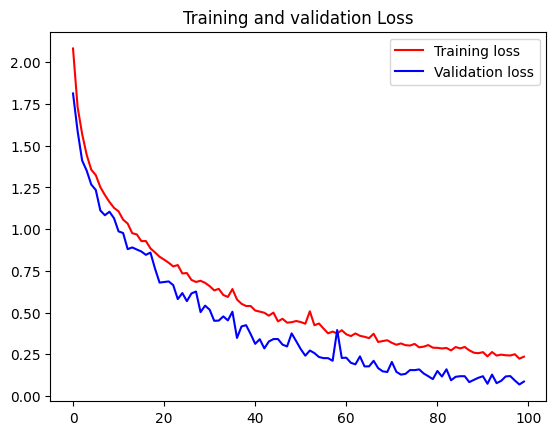

<Figure size 640x480 with 0 Axes>

In [20]:
# plot akurasi & loss
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()

plt.plot(epochs, loss, 'r', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation Loss')
plt.legend(loc=0)
plt.figure()

plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━

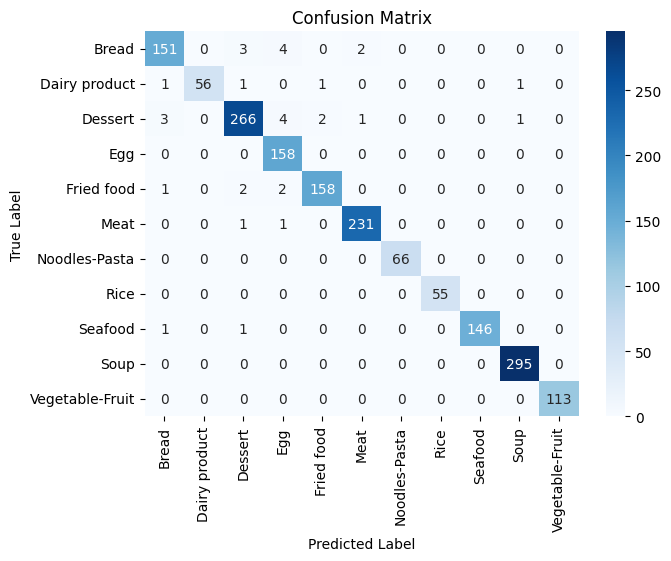

In [23]:
# confusion matrix
y_true = []
y_pred = []

for images, labels in test_dataset:
  predictions = model.predict(images)
  predicted_labels = np.argmax(predictions, axis = 1)
  true_labels = labels.numpy()
  y_true.extend(true_labels)
  y_pred.extend(predicted_labels)

confusion_matrix = confusion_matrix(y_true, y_pred)

plt.figure(figsize= (7,5))
sns.heatmap(confusion_matrix, annot=True, fmt="d",
cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

## Konversi Model

In [27]:
# SavedModel
model.export("saved_model/")

Saved artifact at 'saved_model/'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name='keras_tensor_5')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  137157166860048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166860240: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166885648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166884496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166886608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166886032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166887376: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166888336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166888144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166888912: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [40]:
# TFLite

import os
output_dir = "tflite"
os.makedirs(output_dir, exist_ok=True)

class_names = ['Bread', 'Dairy product', 'Dessert', 'Egg', 'Fried food', 'Meat', 'Noodles-Pasta', 'Rice', 'Seafood', 'Soup', 'Vegetable-Fruit']
labels_path = os.path.join(output_dir, "labels.txt")
with open(labels_path, "w") as f:
    for label in class_names:
        f.write(label + "\n")

converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.target_spec.supported_ops = [
    tf.lite.OpsSet.TFLITE_BUILTINS,
    tf.lite.OpsSet.SELECT_TF_OPS
]
tflite_model = converter.convert()

tflite_model_path = os.path.join(output_dir, "model.tflite")
with open(tflite_model_path, "wb") as f:
    f.write(tflite_model)

Saved artifact at '/tmp/tmp1wtgka2o'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name='keras_tensor_5')
Output Type:
  TensorSpec(shape=(None, 11), dtype=tf.float32, name=None)
Captures:
  137157166860048: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166860240: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166885648: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166884496: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166886608: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166886032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166887376: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166888336: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166888144: TensorSpec(shape=(), dtype=tf.resource, name=None)
  137157166888912: TensorSpec(shape=(), dtype=tf.resource, name=None)


In [36]:
# TFJS
!pip install tensorflowjs

!tensorflowjs_converter --input_format=tf_saved_model \
    saved_model/ tfjs_model/

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 4.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 4.3 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfully uninstalled packaging-24.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
db-dtypes 1.4.3 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
google-cloud-bigquery 3.32.0 requires packaging>=24.2.0, but you have packaging 23.2 which is incompatible.
2025-05-19 00:18:33.744222: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747613913.763717   42684 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attem

## Inference (Optional)

In [41]:
# Load TFLite model
interpreter = tf.lite.Interpreter(model_path="tflite/model.tflite")
interpreter.allocate_tensors()

# Dapatkan detail input dan output
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

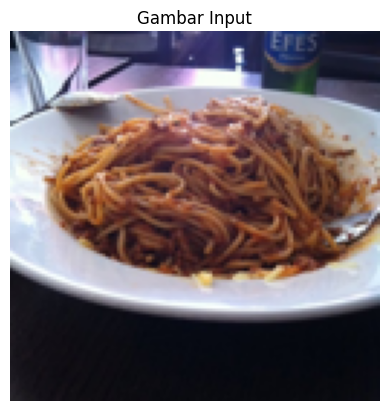

In [51]:
from PIL import Image

# Gambar test
img_path = "/content/Food-11/Noodles-Pasta/ 001.jpg"
image_size = 128

# Load dan preprocess gambar
img = Image.open(img_path).resize((image_size, image_size))
img_array = np.array(img).astype(np.float32) / 255.0
input_data = np.expand_dims(img_array, axis=0)

# Tampilkan gambar
plt.imshow(img)
plt.axis("off")
plt.title("Gambar Input")
plt.show()


In [52]:
# Set input dan jalankan inferensi
interpreter.set_tensor(input_details[0]['index'], input_data)
interpreter.invoke()

# Ambil hasil output
output_data = interpreter.get_tensor(output_details[0]['index'])
predicted_label_index = np.argmax(output_data)
print("Output Probabilitas:", output_data)
print("Label Terprediksi:", predicted_label_index)

Output Probabilitas: [[5.7993323e-04 4.8498089e-07 1.6429019e-03 1.9432621e-06 3.6606721e-08
  4.1338507e-04 9.9733478e-01 1.1988331e-07 3.3014652e-07 2.6086467e-05
  7.0040072e-09]]
Label Terprediksi: 6


In [53]:
# Baca file label
with open("tflite/labels.txt", "r") as f:
    labels = [line.strip() for line in f.readlines()]

# Tampilkan hasil klasifikasi
predicted_label = labels[predicted_label_index]
print("Label Klasifikasi:", predicted_label)


Label Klasifikasi: Noodles-Pasta
